In [1]:
%cd ".."

/home/id1896/python/2A/projet-statistique-2022


In [30]:


from gensim import models
import json
import numpy as np
import pandas as pd
import doc_embedding.moyenne as moyenne
import clustering
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import ClusterEnsembles as ce
from sklearn.metrics import calinski_harabasz_score, silhouette_score

In [64]:
#import importlib
#clustering = importlib.reload(clustering)

In [3]:
cbow_model = models.KeyedVectors.load_word2vec_format('data/tunning/cbow.kv')
data = pd.DataFrame(cbow_model.vectors,index=cbow_model.index_to_key)

In [4]:
with open('data/docs.json', encoding = "utf8") as f:
    docs: list[str] = json.load(f)
print(f"Nombre de documents : {len(docs)}")

Nombre de documents : 9501


In [5]:
res = moyenne.word_emb_vers_doc_emb_moyenne(docs, cbow_model, methode = 'TF')

In [8]:
res = np.array(res)

In [10]:
tsne = TSNE(n_components = 2, perplexity = 25, random_state=0)
tsne_results = tsne.fit_transform(res)
tsne_results=pd.DataFrame(tsne_results, columns=['tsne1', 'tsne2'])

/home/id1896/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/home/id1896/.local/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


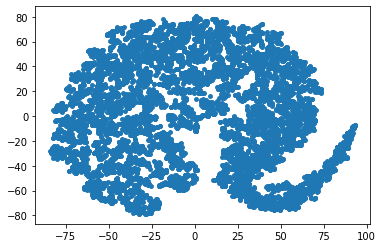

In [13]:
plt.scatter(tsne_results['tsne1'], tsne_results['tsne2'], s=15)

In [17]:
list_kmeans_moyenne = [KMeans(k, verbose = 1).fit(tsne_results) for k in range(3,11)]

Initialization complete
Iteration 0, inertia 16440725.0
Iteration 1, inertia 12951978.0
Iteration 2, inertia 11982246.0
Iteration 3, inertia 11928824.0
Iteration 4, inertia 11904648.0
Iteration 5, inertia 11886028.0
Iteration 6, inertia 11877789.0
Iteration 7, inertia 11875077.0
Converged at iteration 7: center shift 0.1690565049648285 within tolerance 0.1837020751953125.
Initialization complete
Iteration 0, inertia 15742408.0
Iteration 1, inertia 12727541.0
Iteration 2, inertia 12291854.0
Iteration 3, inertia 12093914.0
Iteration 4, inertia 11995363.0
Iteration 5, inertia 11952279.0
Iteration 6, inertia 11929048.0
Iteration 7, inertia 11908744.0
Iteration 8, inertia 11888771.0
Iteration 9, inertia 11879997.0
Iteration 10, inertia 11875756.0
Iteration 11, inertia 11874448.0
Converged at iteration 11: center shift 0.15779352188110352 within tolerance 0.1837020751953125.
Initialization complete
Iteration 0, inertia 15011236.0
Iteration 1, inertia 12570745.0
Iteration 2, inertia 12192019.

In [25]:
labels = [kmeans_moyenne.labels_ for kmeans_moyenne in list_kmeans_moyenne]

In [26]:
label_ce = ce.cluster_ensembles(labels)

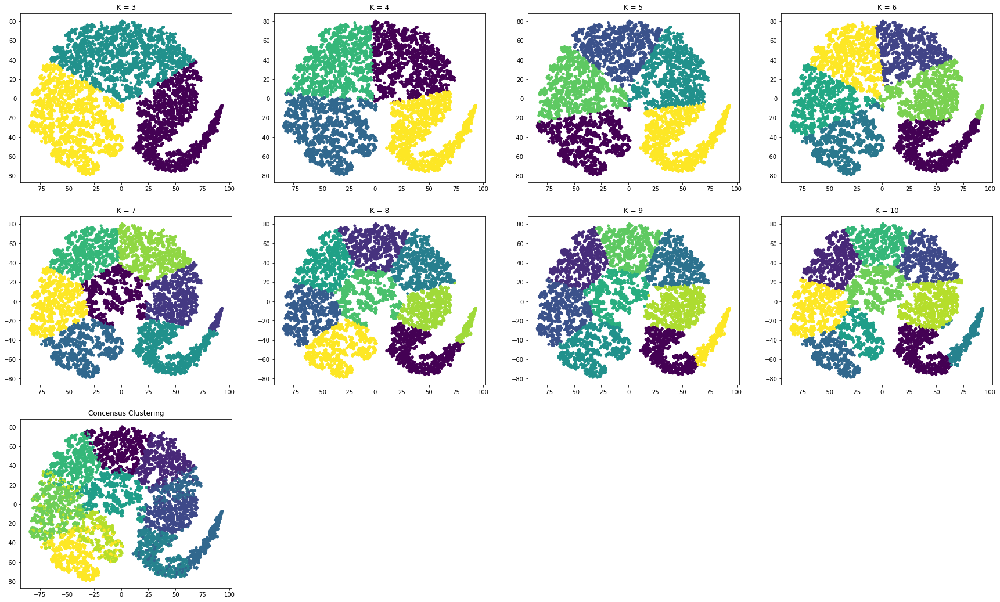

In [29]:

plt.figure(figsize = (30,10))
plt.subplots_adjust(top = 1.5) 
for index, p in enumerate(range(3,11)):
    plt.subplot(3,4,index+1)
    plt.scatter(tsne_results['tsne1'], tsne_results['tsne2'], s=15,c=list_kmeans_moyenne[index].labels_.astype(float))
    plt.title('K = '+ str(p))
    
plt.subplot(3,4,index+2)
plt.scatter(tsne_results['tsne1'], tsne_results['tsne2'], s=15,c=label_ce.astype(float))
plt.title('Concensus Clustering')
plt.show()


Concensus silhouette score:  0.27851918


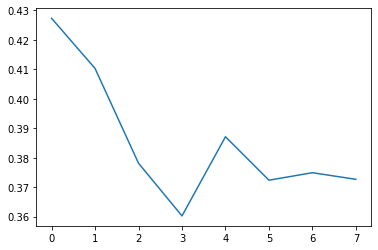

In [32]:
print("Concensus silhouette score: ", silhouette_score(tsne_results, label_ce))
list_silhouette = [silhouette_score(tsne_results, lab) for lab in labels]
plt.plot(list_silhouette)

In [ ]:
print("Concensus calinski_harabasz_score score: ", calinski_harabasz_score(tsne_results, label_ce))
list_silhouette = [calinski_harabasz_score(tsne_results, lab) for lab in labels]
plt.plot(list_silhouette)